In [1]:
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from random import random
import scipy
import scipy.spatial
from collections import Counter

In [2]:
# Generating three classes
class1 = np.random.multivariate_normal([50,20], [[7,0],[0,7]], 100)
class2 = np.random.multivariate_normal([40,30], [[4,0],[0,4]], 100)
class3 = np.random.multivariate_normal([45,25], [[5,0],[0,10]], 100)

In [12]:
#Displaying the classes
# fig = go.Figure()
# fig.add_trace(
#     go.Scatter(x=class1[:,0], y=class1[:,1],marker_color="blue", name="Class 1", mode="markers")
# )
# fig.add_trace(
#     go.Scatter(x=class2[:,0], y=class2[:,1],marker_color="red", name="Class 2", mode="markers")
# )
# fig.add_trace(
#     go.Scatter(x=class3[:,0], y=class3[:,1],marker_color="green", name="Class 3", mode="markers")
# )

Simple Probability

$$p(y=y_i|x;D_{tr})=\frac{1}{K}\displaystyle\sum_{i\in \mathcal{S}_{k}(x)}I(y=y_i)$$

Weighted probability

$$p(y=y_i|x;D_{tr})=\frac{\displaystyle\sum_{i\in \mathcal{S}_{k}(x)}I(y=y_i)w(x,x_i)}{{\displaystyle\sum_{i\in \mathcal{S}_{k}(x)}}w(x,x_i)}$$

Softmax probability

$$p(y=y_i|x;D_{tr},\beta, \theta)=\frac{exp[\frac{\beta}{K}\displaystyle\sum_{i\in \mathcal{S}_{k}(x)}I(y=y_i)w(x,x_i)]}{\displaystyle\sum_{y'\in{{C_1,C_2,...,C_n}}}exp[\frac{\beta}{K}\displaystyle\sum_{i\in \mathcal{S}_{k}(x)}I(y'=y_i)w(x,x_i)]}$$

In [4]:
X = np.concatenate((class1, class2, class3))
Y = np.array(['Class 1']*np.shape(class1)[0] + ['Class 2']*np.shape(class2)[0] +['Class 3']*np.shape(class3)[0])
def predict_simple(x_test, X ,Y, k):
    tree = scipy.spatial.cKDTree(X)
    dd, ii = tree.query(x_test, k=k)
    ct = Counter(list(Y[ii]))
    probability = dict()
    probability['Class 1'] = ct['Class 1']/k
    probability['Class 2'] = ct['Class 2']/k
    probability['Class 3'] = ct['Class 3']/k
    return probability
def predict_simple_weights(x_test, X ,Y, k):
    tree = scipy.spatial.cKDTree(X)
    dd, ii = tree.query(x_test, k=k)
    probability=dict()
    probability['Class 1'] = 0
    probability['Class 2'] = 0
    probability['Class 3'] = 0
    for i in range(k):
        if Y[ii][i] == "Class 1":
            probability['Class 1'] += 1/dd[i]
        elif Y[ii][i] == "Class 2":
            probability['Class 2'] += 1/dd[i]
        else:
            probability['Class 3'] += 1/dd[i]
    probability['Class 1'] = (probability['Class 1'])/(sum(1/dd))
    probability['Class 2'] = (probability['Class 2'])/(sum(1/dd))
    probability['Class 3'] = (probability['Class 3'])/(sum(1/dd))
    return probability
def predict_softmax(x_test, X ,Y, k, beta):
    tree = scipy.spatial.cKDTree(X)
    dd, ii = tree.query(x_test, k=k)
    probability=dict()
    probability['Class 1'] = 0
    probability['Class 2'] = 0
    probability['Class 3'] = 0
    for i in range(k):
        if Y[ii][i] == "Class 1":
            probability['Class 1'] += 1/dd[i]
        elif Y[ii][i] == "Class 2":
            probability['Class 2'] += 1/dd[i]
        else:
            probability['Class 3'] += 1/dd[i]
    probability['Class 1'] = (np.exp((beta/k)*probability['Class 1']))/sum(np.exp((beta/k)*np.array(list(probability.values()))))
    probability['Class 2'] = (np.exp((beta/k)*probability['Class 2']))/sum(np.exp((beta/k)*np.array(list(probability.values()))))
    probability['Class 3'] = (np.exp((beta/k)*probability['Class 3']))/sum(np.exp((beta/k)*np.array(list(probability.values()))))
    return probability

In [5]:
#Creating a mesh
mesh_size = .1
margin = 2
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)
X_grid = np.c_[xx.ravel(), yy.ravel()]

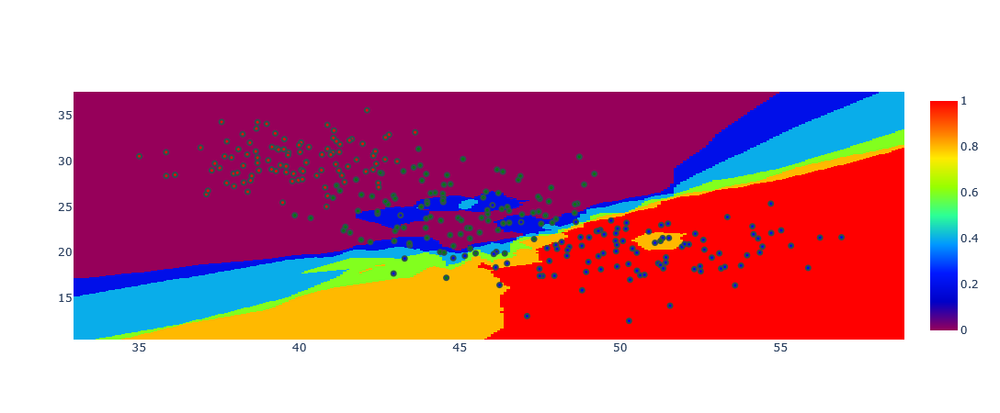

In [10]:
out_class1 = []
out_class2 = []
out_class3 = []
for i in range(X_grid.shape[0]):
    out = predict_simple(X_grid[i,:], X,Y, 5)
    out_class1.append(out['Class 1'])
    out_class2.append(out['Class 2'])
    out_class3.append(out['Class 3'])
data = pd.DataFrame(data={'x':X_grid[:,0], 'y':X_grid[:,1], 'z':out_class1})
fig = go.Figure(data=go.Heatmap(
          x = data['x'],
          y = data['y'],
          z = data['z'],
          type = 'heatmap',
          colorscale = 'Rainbow'))
fig.add_trace(
    go.Scatter(x=class1[:,0], y=class1[:,1],marker_color="blue", mode="markers", name="")
)
fig.add_trace(
    go.Scatter(x=class2[:,0], y=class2[:,1],marker_color="red", mode="markers", name="")
)
fig.add_trace(
    go.Scatter(x=class3[:,0], y=class3[:,1],marker_color="green", mode="markers", name="")
)
fig.update_traces(marker=dict(size=5,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
# fig.show()

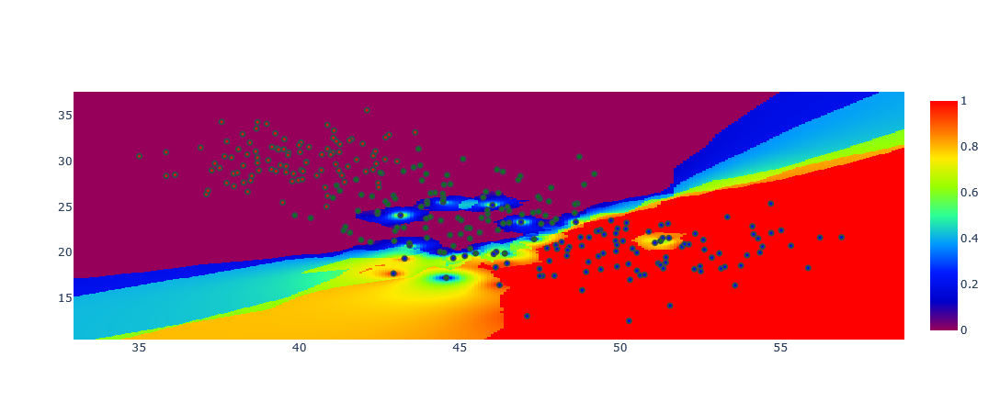

In [11]:
out_class1 = []
out_class2 = []
out_class3 = []
for i in range(X_grid.shape[0]):
    out = predict_simple_weights(X_grid[i,:], X,Y, 5)
    out_class1.append(out['Class 1'])
    out_class2.append(out['Class 2'])
    out_class3.append(out['Class 3'])
data = pd.DataFrame(data={'x':X_grid[:,0], 'y':X_grid[:,1], 'z':out_class1})
fig = go.Figure(data=go.Heatmap(
          x = data['x'],
          y = data['y'],
          z = data['z'],
          type = 'heatmap',
          colorscale = 'Rainbow'))
fig.add_trace(
    go.Scatter(x=class1[:,0], y=class1[:,1],marker_color="blue", mode="markers", name="")
)
fig.add_trace(
    go.Scatter(x=class2[:,0], y=class2[:,1],marker_color="red", mode="markers", name="")
)
fig.add_trace(
    go.Scatter(x=class3[:,0], y=class3[:,1],marker_color="green", mode="markers", name="")
)
fig.update_traces(marker=dict(size=5,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
# fig.show()

In [13]:
# out_class1 = []
# out_class2 = []
# out_class3 = []
# for i in range(X_grid.shape[0]):
#     out = predict_softmax(X_grid[i,:], X,Y, 5, 1)
#     out_class1.append(out['Class 1'])
#     out_class2.append(out['Class 2'])
#     out_class3.append(out['Class 3'])
# data = pd.DataFrame(data={'x':X_grid[:,0], 'y':X_grid[:,1], 'z':out_class1})
# fig = go.Figure(data=go.Heatmap(
#           x = data['x'],
#           y = data['y'],
#           z = data['z'],
#           type = 'heatmap',
#           colorscale = 'Rainbow'))
# fig.add_trace(
#     go.Scatter(x=class1[:,0], y=class1[:,1],marker_color="blue", mode="markers", name="")
# )
# fig.add_trace(
#     go.Scatter(x=class2[:,0], y=class2[:,1],marker_color="red", mode="markers", name="")
# )
# fig.add_trace(
#     go.Scatter(x=class3[:,0], y=class3[:,1],marker_color="green", mode="markers", name="")
# )
# fig.update_traces(marker=dict(size=5,
#                               line=dict(width=2,
#                                         color='DarkSlateGrey')),
#                   selector=dict(mode='markers'))
# fig.show()